# Stereo Disparity Algorithms
## Sum of Absolute Differences and Visualization of the Results

*Sebstian Hahta, 11th of August 2019*
*Comments and edits by Mio Mattila*

---

## Loading and Displaying Images

Initially, it might be good idea to scale large images as processing in Python is quite slow.

Later on, intermediate results can also be saved (instead of overwriting them in next step).

[Middlebury stereo algorithm datasets](http://vision.middlebury.edu/stereo/data/scenes2006/) 

In [2]:
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize

#imL = imread("aloe/view1.png")
#imR = imread("aloe/view5.png")
#imGT = imread("aloe/disp1.png") * (1.0/3.0)

# Plots later on are calculated for Tsukuba image pair

imL = imread("tsukuba/imL.png")
imR = imread("tsukuba/imR.png")
imGT = imread("tsukuba/gt.png") * (1.0/16.0)

if imL.shape[1] > 320:
    scale = imL.shape[1] // 320
    # mode and anti_aliasing set (defaults) to suppress changed defaults warning in skimage
    imL = resize(imL, (imL.shape[0]//scale, imL.shape[1]//scale), mode="constant", anti_aliasing=True)
    imR = resize(imR, (imR.shape[0]//scale, imR.shape[1]//scale), mode="constant", anti_aliasing=True)
    print("New size:", imR.shape[0:2])

plt.subplot(121)
plt.imshow(imL)
plt.axis("off")
plt.subplot(122)
plt.imshow(imR)
plt.axis("off")
plt.gcf().set_size_inches(16, 8)
plt.show()

New size: (288, 384)


<Figure size 1600x800 with 2 Axes>

## Calculating Disparity (Cost) Space Image (DSI)

Example uses Sum of Absolute Differences as matching cost. Requires somewhat large mask sizes for acceptable results. 

Disparity can be calculated from left to right and right to left. Simple implementation trick is to change the sign for disparity search.

Bounds check need to take image  dimensions and window sizes into account.

In [3]:
import numpy as np
from numpy.linalg import norm

#TESTEJÄ, POISTA NÄMÄ
from skimage.filters import laplace
from skimage.color import rgb2gray
edgesL = laplace(rgb2gray(imL),3)
edgesR = laplace(rgb2gray(imR),3)

def calculate_DSI(L, R, n_disp, cost, sign=1):
    assert L.shape == R.shape
    
    rows = L.shape[0]
    cols = L.shape[1]
    
    #alustetaan float array jolla on niin monta arvoa kuin disparity-tasoja
    dsi = np.ndarray((rows, cols, n_disp), np.float)
    #tässä tapauksessa vertaillaan esim pikseliä 0,0,0 kaikkiin muihin pikseleihin kuvassa
    for y in range(0, rows):
        for x in range(0, cols):
            for d in range(0, n_disp):
                #palauttaa matching costin jokaiselle pikselille yksitellen, alkaa isolla liudalla 'inf' arvoja
                #lisää matching costit yksitellen matriisiin 'dsi' suoritusjärjestyksessä.
                #kokeiluja:
                #cost on funktio calculate_DSI
                #print("sign * d: ", sign * d) - antaa arvoja 0-41
                
                #yhdelle pikselille jokaista disparity-tasoa(42) vastaava arvo pikselin tasossa.
                #dsi[y, x, d] = cost(L, R, x, y, sign * d)
                
                dsi[y, x, d] = cost(L, R, x, y, sign * d) # + edgesL[y, x] + edgesR[y, x]
                
    #print(dsi.shape) palauttaa (288, 384, 42)
    return dsi

#lasketaan matching cost
def calculate_SAD(L, R, x, y, d, w_size=7):
    
    rows = L.shape[0]
    cols = L.shape[1]
    
    w_size = w_size // 2
    
    #testataan meneekö y-koordinaatti matriisin rajojen ulkopuolelle alhaalta tai ylhäältä
    if not (w_size < y < (rows - w_size)):
        return float("inf")
    #sama y:lle
    if not (w_size < x < (cols - w_size)):
        return float("inf")
    #vaikuttaa pikselien vertailuun vertikaalisesti, jos ei tilaa puolin ja toisin, luovuta
    if not (w_size < (x - d) < (cols - w_size)):
        return float("inf")
    
    y_min = y - w_size
    y_max = y + w_size + 1
    x_min = x - w_size
    x_max = x + w_size + 1
    
    # Get w_size * w_size blocks from both images centered at (x, y)
    # and calculate the Sum of Absolute Differences (SAD)
    
    #res taitannaa olla koko summamateriisin arvot
    res = L[y_min:y_max,x_min:x_max,:] - R[y_min:y_max,(x_min - d):(x_max - d),:]
    
    #testejä
    #print("res: ", res)
    #print("vasemman vertailuarvo: ", L[y_min:y_max,x_min:x_max,:])
    #print("oikean vertailuarvo: ", R[y_min:y_max,(x_min - d):(x_max - d),:])
    #print(res.shape, L[y_min:y_max,x_min:x_max,:].shape, R[y_min:y_max,(x_min - d):(x_max - d),:].shape)
    res = np.absolute(res)
    #print("res2: ",res , np.sum(res), res.shape)
    #np.sum(res) palauttaa kaikkien (7, 7, 3) - matriisin arvojen summan, arvot matriisissa ovat float-muodossa.
    #palauttaa vertailtujen pikseleiden summa-arvon, mitä suurempi, sitä vähemmän arvot sopivat yhteen.
    return np.sum(res)

dsi_lr = calculate_DSI(imL, imR, 21, calculate_SAD, 1)
#print(dsi_lr.shape) palauttaa (288, 384, 42)
dsi_rl = calculate_DSI(imR, imL, 21, calculate_SAD, -1)

[[[ 5.55111512e-17 -5.55111512e-17 -5.55111512e-17]
  [ 3.92156863e-03 -3.92156863e-03 -3.92156863e-03]
  [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
  [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
  [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
  [ 0.00000000e+00  3.46944695e-18  0.00000000e+00]
  [ 0.00000000e+00  3.46944695e-18  0.00000000e+00]]

 [[ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
  [ 8.67361738e-19 -3.46944695e-18 -8.67361738e-19]
  [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
  [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
  [-1.56125113e-17  3.81639165e-17 -6.93889390e-18]
  [-2.42861287e-17  3.92156863e-03 -1.04083409e-17]
  [-2.08166817e-17  3.92156863e-03 -8.67361738e-18]]

 [[ 1.17647059e-02  1.56862745e-02  1.17647059e-02]
  [-1.17647059e-02 -1.17647059e-02  1.56862745e-02]
  [-4.31372549e-02 -3.52941176e-02 -1.17647059e-02]
  [-2.35294118e-02 -2.74509804e-02 -1.96078431e-02]
  [-3.52941176e-02 -3.52941176e-02 -1.56862745e-02]
  [-5.49

[[[-3.92156863e-03 -3.92156863e-03 -3.92156863e-03]
  [ 3.92156863e-03 -1.07552856e-16  3.92156863e-03]
  [-3.92156863e-03 -7.84313725e-03 -3.92156863e-03]
  [ 3.92156863e-03  7.84313725e-03 -3.98986399e-17]
  [-3.92156863e-03 -3.92156863e-03 -3.92156863e-03]
  [ 3.92156863e-03  7.84313725e-03  3.92156863e-03]
  [-3.92156863e-03 -7.84313725e-03 -7.84313725e-03]]

 [[-3.92156863e-03  1.49186219e-16  1.36175793e-16]
  [ 3.92156863e-03  3.92156863e-03  3.92156863e-03]
  [-7.84313725e-03 -1.17647059e-02 -7.84313725e-03]
  [ 3.92156863e-03  3.92156863e-03  7.84313725e-03]
  [-3.92156863e-03 -3.92156863e-03 -3.92156863e-03]
  [ 3.92156863e-03  3.92156863e-03  7.84313725e-03]
  [-3.92156863e-03 -3.92156863e-03 -7.84313725e-03]]

 [[ 7.84313725e-03  1.94289029e-16 -3.92156863e-03]
  [ 2.35294118e-02  1.56862745e-02  2.74509804e-02]
  [ 7.05882353e-02  5.09803922e-02  4.70588235e-02]
  [ 1.33333333e-01  1.13725490e-01  1.09803922e-01]
  [ 6.27450980e-02  5.88235294e-02  5.49019608e-02]
  [ 3.13

  [ 3.13725490e-02 -7.84313725e-03 -7.05882353e-02]]]
[[[ 3.92156863e-03  7.84313725e-03  3.92156863e-03]
  [-3.92156863e-03 -3.92156863e-03 -3.92156863e-03]
  [ 3.92156863e-03  7.84313725e-03  7.84313725e-03]
  [-3.92156863e-03 -7.84313725e-03 -7.84313725e-03]
  [ 3.92156863e-03  7.84313725e-03  7.84313725e-03]
  [-3.92156863e-03 -7.84313725e-03 -7.84313725e-03]
  [ 3.92156863e-03  3.92156863e-03  3.92156863e-03]]

 [[ 3.92156863e-03  3.92156863e-03  7.84313725e-03]
  [-3.92156863e-03 -3.92156863e-03 -7.84313725e-03]
  [ 3.92156863e-03  3.92156863e-03  7.84313725e-03]
  [-3.92156863e-03 -3.92156863e-03 -7.84313725e-03]
  [ 3.92156863e-03  3.92156863e-03  3.92156863e-03]
  [-3.92156863e-03 -3.92156863e-03 -7.84313725e-03]
  [ 3.92156863e-03  3.92156863e-03  3.92156863e-03]]

 [[ 3.52941176e-02  4.31372549e-02  3.92156863e-02]
  [ 3.92156863e-02  4.70588235e-02  1.56862745e-02]
  [-1.38777878e-16  2.35294118e-02  3.92156863e-03]
  [-1.17647059e-02 -3.92156863e-03 -1.17647059e-02]
  [-7.

  [-3.25490196e-01 -2.39215686e-01 -1.64705882e-01]]]
[[[ 0.00000000e+00 -5.55111512e-17 -5.55111512e-17]
  [ 0.00000000e+00 -3.92156863e-03 -3.92156863e-03]
  [ 0.00000000e+00 -5.55111512e-17 -5.55111512e-17]
  [ 0.00000000e+00 -3.92156863e-03 -3.92156863e-03]
  [ 0.00000000e+00 -5.55111512e-17  0.00000000e+00]
  [ 0.00000000e+00 -3.92156863e-03  1.73472348e-18]
  [ 0.00000000e+00  1.38777878e-17  0.00000000e+00]]

 [[ 3.12250226e-17  3.81639165e-17 -3.98986399e-17]
  [-4.85722573e-17  3.46944695e-18 -3.92156863e-03]
  [ 1.09287579e-16  7.63278329e-17  5.03069808e-17]
  [ 1.59594560e-16  1.17961196e-16  8.50014503e-17]
  [-5.72458747e-17 -6.59194921e-17 -1.48318857e-16]
  [ 0.00000000e+00  3.46944695e-17  2.60208521e-17]
  [-3.28730099e-16  3.92156863e-03  2.51534904e-17]]

 [[-7.84313725e-03 -7.84313725e-03 -1.17647059e-02]
  [-2.74509804e-02 -1.17647059e-02 -1.56862745e-02]
  [ 2.74509804e-02  1.56862745e-02  7.84313725e-03]
  [ 4.31372549e-02  2.35294118e-02  1.17647059e-02]
  [-1.

  [ 3.01960784e-01  2.11764706e-01  1.45098039e-01]]]
[[[ 0.00000000e+00 -3.92156863e-03  1.73472348e-18]
  [ 0.00000000e+00  1.38777878e-17  0.00000000e+00]
  [ 0.00000000e+00 -1.38777878e-17  5.55111512e-17]
  [ 0.00000000e+00  1.38777878e-17  3.92156863e-03]
  [ 0.00000000e+00  0.00000000e+00 -3.92156863e-03]
  [ 0.00000000e+00 -5.55111512e-17  2.61228947e-18]
  [ 0.00000000e+00 -3.92156863e-03  1.90819582e-17]]

 [[ 0.00000000e+00  3.46944695e-17  2.60208521e-17]
  [-3.28730099e-16  3.92156863e-03  2.51534904e-17]
  [-6.73072709e-16 -3.92156863e-03 -2.65412692e-16]
  [ 2.92300906e-16  3.92156863e-03  2.52402266e-16]
  [ 4.16333634e-17  9.36750677e-17 -3.92156863e-03]
  [ 1.19695920e-16  1.21430643e-16  1.76074433e-16]
  [ 3.97251676e-16  2.28983499e-16  3.92156863e-03]]

 [[-3.92156863e-03 -1.56862745e-02 -7.84313725e-03]
  [-1.13725490e-01 -7.84313725e-02 -3.13725490e-02]
  [-2.07843137e-01 -1.13725490e-01 -9.80392157e-02]
  [ 3.92156863e-02  5.49019608e-02  5.09803922e-02]
  [-5.

  [-7.84313725e-03  3.92156863e-03 -7.84313725e-03]]]
[[[ 0.00000000e+00  1.38777878e-17 -5.55111512e-17]
  [ 0.00000000e+00 -1.73472348e-17 -3.92156863e-03]
  [ 0.00000000e+00 -4.16333634e-17 -5.22457894e-17]
  [ 0.00000000e+00 -3.92156863e-03 -3.92156863e-03]
  [ 0.00000000e+00  0.00000000e+00  3.92156863e-03]
  [ 0.00000000e+00 -3.46944695e-18  2.08166817e-17]
  [ 0.00000000e+00  1.73472348e-17 -5.55111512e-17]]

 [[ 9.40220124e-16  3.92156863e-03  5.64652491e-16]
  [-8.32667268e-17 -3.92156863e-03 -3.92156863e-03]
  [ 2.71484224e-16  3.92156863e-03  2.09034179e-16]
  [ 1.63064007e-16  1.11022302e-16  6.59194921e-17]
  [-2.22911967e-16 -6.24500451e-17  8.84708973e-17]
  [-7.94503352e-16 -3.98986399e-16  3.92156863e-03]
  [-2.16840434e-17  3.92156863e-03  2.26381414e-16]]

 [[ 2.03921569e-01  1.21568627e-01  1.17647059e-01]
  [-9.01960784e-02 -8.23529412e-02 -6.66666667e-02]
  [-3.33066907e-16  3.92156863e-03 -4.44089210e-16]
  [-2.74509804e-02 -2.35294118e-02 -3.52941176e-02]
  [-1.

  [-7.84313725e-03 -7.84313725e-03 -1.96078431e-02]]]
[[[ 3.92156863e-03  3.92156863e-03  3.92156863e-03]
  [-3.92156863e-03 -7.84313725e-03 -7.84313725e-03]
  [ 3.92156863e-03  7.84313725e-03  7.84313725e-03]
  [-3.92156863e-03 -7.84313725e-03 -7.84313725e-03]
  [ 3.92156863e-03  7.84313725e-03  7.84313725e-03]
  [-3.92156863e-03 -7.84313725e-03 -3.92156863e-03]
  [ 3.92156863e-03  7.84313725e-03  3.92156863e-03]]

 [[ 3.92156863e-03  7.84313725e-03  7.84313725e-03]
  [-3.92156863e-03 -7.84313725e-03 -7.84313725e-03]
  [ 3.92156863e-03  7.84313725e-03  7.84313725e-03]
  [-3.92156863e-03 -3.92156863e-03 -7.84313725e-03]
  [-1.02348685e-15  3.92156863e-03  3.92156863e-03]
  [-3.92156863e-03 -3.92156863e-03 -3.92156863e-03]
  [ 3.92156863e-03  7.84313725e-03  3.92156863e-03]]

 [[ 1.56862745e-01  5.88235294e-02  5.49019608e-02]
  [-1.52941176e-01 -1.25490196e-01 -9.41176471e-02]
  [-2.78431373e-01 -1.56862745e-01 -1.13725490e-01]
  [-2.86274510e-01 -1.64705882e-01 -1.09803922e-01]
  [-2.

[[[ 0.00000000e+00  5.55111512e-17 -5.55111512e-17]
  [ 0.00000000e+00  3.92156863e-03 -3.92156863e-03]
  [ 0.00000000e+00  2.08166817e-17  1.90819582e-17]
  [ 0.00000000e+00 -3.46944695e-18  0.00000000e+00]
  [ 0.00000000e+00 -5.55111512e-17  3.48305263e-18]
  [ 0.00000000e+00 -3.92156863e-03  3.12250226e-17]
  [ 0.00000000e+00 -5.55111512e-17  3.92156863e-03]]

 [[ 1.73472348e-17 -2.08166817e-17  0.00000000e+00]
  [-3.12250226e-17  1.28369537e-16  1.85615412e-16]
  [ 6.02816408e-16  3.92156863e-03  3.92156863e-03]
  [ 3.88578059e-16  3.40005801e-16  2.82759927e-16]
  [-8.67361738e-18  2.77555756e-17  2.51534904e-17]
  [ 6.92154667e-16 -3.92156863e-03 -3.92156863e-03]
  [ 1.34094125e-15  1.05818132e-15  8.74300632e-16]]

 [[-3.92156863e-03 -1.96078431e-02 -2.35294118e-02]
  [-1.17647059e-02  1.36002321e-15  3.92156863e-03]
  [ 1.01960784e-01  9.80392157e-02  1.01960784e-01]
  [ 5.09803922e-02  3.52941176e-02  1.56862745e-02]
  [-2.74509804e-02 -1.56862745e-02 -2.35294118e-02]
  [ 9.01

[[[ 0.00000000e+00  0.00000000e+00 -3.92156863e-03]
  [ 0.00000000e+00  0.00000000e+00 -5.20417043e-18]
  [ 0.00000000e+00 -3.46944695e-17  1.90819582e-17]
  [ 0.00000000e+00 -3.92156863e-03  5.55111512e-17]
  [ 0.00000000e+00 -5.55111512e-17  3.92156863e-03]
  [ 0.00000000e+00 -3.92156863e-03 -3.92156863e-03]
  [ 0.00000000e+00 -8.32667268e-17  3.92156863e-03]]

 [[ 6.23633090e-16  6.21031004e-16  6.40980324e-16]
  [ 1.33053291e-15  1.20042865e-15  1.05297715e-15]
  [ 2.43468440e-15  3.92156863e-03  3.92156863e-03]
  [ 1.70176373e-15  1.20389809e-15  7.92768629e-16]
  [ 1.47451495e-15  1.04777298e-15 -3.92156863e-03]
  [ 1.66186509e-15 -3.92156863e-03 -3.92156863e-03]
  [ 9.20270804e-16 -3.92156863e-03  5.58580959e-16]]

 [[ 9.80392157e-02  8.62745098e-02  7.84313725e-02]
  [ 2.03921569e-01  1.60784314e-01  1.25490196e-01]
  [ 3.88235294e-01  3.01960784e-01  2.39215686e-01]
  [ 2.50980392e-01  1.60784314e-01  9.01960784e-02]
  [ 1.76470588e-01  1.13725490e-01  5.09803922e-02]
  [ 2.19

  [ 7.84313725e-03 -7.84313725e-03 -9.71445147e-16]]]
[[[ 0.00000000e+00  5.55111512e-17  5.55111512e-17]
  [ 2.94902991e-17  3.92156863e-03  3.92156863e-03]
  [-2.94902991e-17 -8.67361738e-17  0.00000000e+00]
  [ 2.94902991e-17 -3.92156863e-03  5.55111512e-17]
  [ 0.00000000e+00  0.00000000e+00  3.92156863e-03]
  [ 0.00000000e+00  0.00000000e+00  3.12250226e-17]
  [ 0.00000000e+00  3.12250226e-17  0.00000000e+00]]

 [[ 0.00000000e+00  0.00000000e+00 -2.68882139e-17]
  [ 3.92156863e-03  3.92156863e-03  3.92156863e-03]
  [-3.92156863e-03 -3.92156863e-03 -7.99707522e-16]
  [ 3.92156863e-03 -1.21430643e-15 -4.73579509e-16]
  [ 3.84241250e-16 -1.76941795e-16  8.54351312e-16]
  [-1.87350135e-16 -5.37764278e-16  3.92156863e-03]
  [-1.25767452e-16  3.92156863e-03  1.63931368e-16]]

 [[-7.84313725e-03 -7.84313725e-03 -1.17647059e-02]
  [-3.13725490e-02 -2.74509804e-02 -2.74509804e-02]
  [-1.56862745e-01 -1.45098039e-01 -1.05882353e-01]
  [-1.76470588e-01 -1.60784314e-01 -6.27450980e-02]
  [ 5.

[[[ 0.00000000e+00 -3.12250226e-17  3.92156863e-03]
  [ 0.00000000e+00  0.00000000e+00  3.12250226e-17]
  [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
  [ 0.00000000e+00  0.00000000e+00 -5.55111512e-17]
  [ 0.00000000e+00 -6.93889390e-18 -3.92156863e-03]
  [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
  [ 0.00000000e+00  2.77555756e-17  0.00000000e+00]]

 [[ 1.66533454e-16 -3.92156863e-03  5.32560107e-16]
  [ 1.92554306e-16  3.33066907e-16  3.92156863e-03]
  [ 3.28730099e-16  4.09394740e-16  3.07913417e-16]
  [ 1.44328993e-15  1.24900090e-15  8.37871439e-16]
  [ 1.33920652e-15  1.42941214e-15 -3.92156863e-03]
  [-1.45716772e-16  5.65519853e-16 -3.00107161e-16]
  [ 3.11382864e-16  3.92156863e-03  7.54604712e-17]]

 [[ 1.66533454e-16  3.92156863e-03  3.13725490e-02]
  [ 3.92156863e-03  1.17647059e-02  3.92156863e-03]
  [ 2.74509804e-02  3.13725490e-02  1.17647059e-02]
  [ 1.76470588e-01  1.45098039e-01  9.41176471e-02]
  [ 1.52941176e-01  1.52941176e-01  5.49019608e-02]
  [-3.52

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[[[ 0.00000000e+00  0.00000000e+00  5.55111512e-17]
  [-5.63785130e-17  0.00000000e+00  3.92156863e-03]
  [-3.92156863e-03  0.00000000e+00  5.55111512e-17]
  [ 0.00000000e+00 -6.93889390e-18  3.92156863e-03]
  [ 0.00000000e+00 -3.92156863e-03  1.04083409e-16]
  [ 0.00000000e+00  4.85722573e-17  3.92156863e-03]
  [ 0.00000000e+00  0.00000000e+00 -3.92156863e-03]]

 [[ 5.44703171e-16  6.34908792e-16  9.95731275e-16]
  [ 5.42968448e-16  9.50628465e-16  1.44936146e-15]
  [-1.35828848e-15 -5.34294831e-16 -1.80411242e-16]
  [ 2.35055031e-16  3.92156863e-03  8.54351312e-16]
  [ 7.51135265e-16  6.21031004e-16  3.92156863e-03]
  [-9.87925020e-16  3.92156863e-03 -1.64574237e-15]
  [ 2.91433544e-16  3.43475248e-16 -5.86336535e-16]]

 [[ 4.70588235e-02  5.49019608e-02  8.62745098e-02]
  [ 4.70588235e-02  8.23529412e-02  1.25490196e-01]
  [-1.17647059e-01 -5.09803922e-02 -1.56862745e-02]
  [ 1.96078431e-02  5.49019608e-02  6.66666667e-02]
  [ 6.27450980e-02  4.70588235e-02  2.74509804e-02]
  [-8.2

  [-2.07843137e-01 -2.47058824e-01 -2.50980392e-01]]]
[[[-3.92156863e-03  0.00000000e+00 -7.84313725e-03]
  [ 0.00000000e+00  0.00000000e+00  3.92156863e-03]
  [ 0.00000000e+00  0.00000000e+00 -3.92156863e-03]
  [ 0.00000000e+00 -5.20417043e-17  3.92156863e-03]
  [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
  [ 0.00000000e+00  5.20417043e-17 -3.46944695e-18]
  [ 0.00000000e+00  5.55111512e-17 -3.92156863e-03]]

 [[ 9.71445147e-17  2.91433544e-16 -3.48679419e-16]
  [ 2.56739074e-16  1.22818422e-15 -3.92156863e-03]
  [ 1.35308431e-15  1.37737044e-15  1.16399945e-15]
  [-5.03069808e-17 -3.92156863e-03 -2.52402266e-16]
  [-1.53002611e-15 -1.91166527e-15 -2.07819872e-15]
  [-2.87096735e-16  3.92156863e-03  3.92156863e-03]
  [-3.13984949e-16 -1.66880398e-15 -2.19442520e-15]]

 [[ 7.84313725e-03  2.35294118e-02 -2.35294118e-02]
  [ 1.17647059e-02  9.01960784e-02  5.49019608e-02]
  [ 9.80392157e-02  1.05882353e-01  8.62745098e-02]
  [-3.92156863e-03  3.92156863e-03 -1.96078431e-02]
  [-1.

[[[-3.92156863e-03 -3.92156863e-03 -3.92156863e-03]
  [ 3.92156863e-03  3.92156863e-03  7.84313725e-03]
  [-3.92156863e-03 -7.84313725e-03 -3.92156863e-03]
  [ 3.92156863e-03  7.84313725e-03  7.84313725e-03]
  [-3.92156863e-03 -3.92156863e-03 -7.84313725e-03]
  [ 3.92156863e-03  3.92156863e-03  7.84313725e-03]
  [-3.92156863e-03 -3.92156863e-03 -1.17647059e-02]]

 [[-3.92156863e-03 -3.92156863e-03 -3.92156863e-03]
  [ 3.92156863e-03  7.84313725e-03  3.92156863e-03]
  [-3.92156863e-03 -3.92156863e-03 -3.92156863e-03]
  [ 3.92156863e-03  7.84313725e-03  7.84313725e-03]
  [-3.92156863e-03 -7.84313725e-03 -7.84313725e-03]
  [ 3.92156863e-03  7.84313725e-03  3.92156863e-03]
  [-3.92156863e-03 -7.84313725e-03 -3.92156863e-03]]

 [[-9.41176471e-02 -8.62745098e-02 -2.35294118e-02]
  [ 1.38777878e-15 -2.74509804e-02  3.92156863e-02]
  [ 9.80392157e-02  7.84313725e-02  1.17647059e-01]
  [-2.74509804e-02  2.35294118e-02  8.62745098e-02]
  [ 3.92156863e-02  1.13725490e-01  1.68627451e-01]
  [ 8.62

  [ 0.16078431  0.13333333  0.15294118]]]
[[[ 0.00000000e+00 -6.24500451e-17  3.92156863e-03]
  [ 0.00000000e+00 -3.92156863e-03  0.00000000e+00]
  [ 0.00000000e+00 -1.04083409e-17  8.70763157e-19]
  [ 0.00000000e+00  0.00000000e+00 -3.92156863e-03]
  [ 0.00000000e+00 -6.93889390e-18  3.92156863e-03]
  [ 0.00000000e+00  0.00000000e+00 -3.92156863e-03]
  [-5.63785130e-17  0.00000000e+00  3.92156863e-03]]

 [[ 1.02782366e-15  1.74513182e-15 -3.92156863e-03]
  [ 1.64451786e-15  1.90819582e-15  2.93688684e-15]
  [ 1.45022883e-15  1.66880398e-15  3.92156863e-03]
  [ 1.53869972e-15  1.97064587e-15  2.12503626e-15]
  [ 9.82720849e-16  1.81799020e-15  1.47711704e-15]
  [ 1.94635974e-15  2.40085729e-15  2.10768902e-15]
  [ 2.41213299e-15  2.91780489e-15  2.83540552e-15]]

 [[ 3.92156863e-02  9.80392157e-02  2.11764706e-01]
  [ 7.84313725e-02  9.80392157e-02  1.76470588e-01]
  [ 5.49019608e-02  7.45098039e-02  1.25490196e-01]
  [ 7.45098039e-02  1.13725490e-01  1.29411765e-01]
  [ 3.13725490e-02

  [-7.84313725e-02 -9.01960784e-02 -3.92156863e-02]]]
[[[-3.92156863e-03 -3.92156863e-03 -3.92156863e-03]
  [ 4.33680869e-18  3.92156863e-03  3.92156863e-03]
  [-3.92156863e-03 -3.92156863e-03 -7.84313725e-03]
  [ 5.20417043e-18  7.84313725e-03  7.84313725e-03]
  [-3.92156863e-03 -3.92156863e-03 -3.92156863e-03]
  [ 3.92156863e-03  3.92156863e-03  3.92156863e-03]
  [-3.92156863e-03 -3.92156863e-03 -7.84313725e-03]]

 [[-3.92156863e-03 -3.92156863e-03 -3.92156863e-03]
  [ 3.92156863e-03  7.84313725e-03  7.84313725e-03]
  [-3.92156863e-03 -7.84313725e-03 -7.84313725e-03]
  [ 3.92156863e-03  7.84313725e-03  3.92156863e-03]
  [-3.92156863e-03 -7.84313725e-03 -3.92156863e-03]
  [ 3.92156863e-03  7.84313725e-03  3.92156863e-03]
  [-3.92156863e-03 -7.84313725e-03 -7.84313725e-03]]

 [[ 9.80392157e-02  8.23529412e-02  8.62745098e-02]
  [ 7.05882353e-02  3.52941176e-02 -1.96078431e-02]
  [ 1.01960784e-01  3.52941176e-02 -3.92156863e-03]
  [ 1.09803922e-01  5.09803922e-02  7.84313725e-03]
  [ 8.

  [ 3.21568627e-01  2.03921569e-01  1.56862745e-01]]]
[[[-3.92156863e-03 -3.92156863e-03 -7.84313725e-03]
  [ 3.92156863e-03  7.84313725e-03  7.84313725e-03]
  [-3.92156863e-03 -3.92156863e-03 -7.84313725e-03]
  [ 3.92156863e-03  7.84313725e-03  3.92156863e-03]
  [-3.92156863e-03 -3.92156863e-03 -3.92156863e-03]
  [ 3.92156863e-03  3.92156863e-03  7.84313725e-03]
  [-3.92156863e-03 -3.92156863e-03 -1.17647059e-02]]

 [[-3.92156863e-03 -7.84313725e-03 -7.84313725e-03]
  [ 3.92156863e-03  7.84313725e-03  7.84313725e-03]
  [-3.92156863e-03 -7.84313725e-03 -7.84313725e-03]
  [ 3.92156863e-03  7.84313725e-03  7.84313725e-03]
  [-3.92156863e-03 -7.84313725e-03 -7.84313725e-03]
  [ 3.92156863e-03  3.92156863e-03  7.84313725e-03]
  [-3.92156863e-03 -7.84313725e-03 -1.17647059e-02]]

 [[-2.35294118e-01 -2.07843137e-01 -1.84313725e-01]
  [-3.96078431e-01 -2.98039216e-01 -2.43137255e-01]
  [-3.01960784e-01 -2.19607843e-01 -1.21568627e-01]
  [-3.80392157e-01 -2.58823529e-01 -1.72549020e-01]
  [-7.

[[[-3.92156863e-03 -3.92156863e-03 -7.84313725e-03]
  [ 3.92156863e-03  3.92156863e-03  7.84313725e-03]
  [-3.92156863e-03 -7.84313725e-03 -1.17647059e-02]
  [ 3.92156863e-03  7.84313725e-03  3.92156863e-03]
  [-3.92156863e-03 -1.17647059e-02 -3.92156863e-03]
  [ 3.92156863e-03  3.92156863e-03  3.92156863e-03]
  [-3.92156863e-03 -3.92156863e-03 -3.92156863e-03]]

 [[-3.92156863e-03 -7.84313725e-03 -7.84313725e-03]
  [ 3.92156863e-03  3.92156863e-03  7.84313725e-03]
  [-3.92156863e-03 -7.84313725e-03 -7.84313725e-03]
  [ 3.92156863e-03  7.84313725e-03  7.84313725e-03]
  [-3.92156863e-03 -7.84313725e-03 -7.84313725e-03]
  [ 3.92156863e-03  7.84313725e-03  7.84313725e-03]
  [-3.92156863e-03 -7.84313725e-03 -3.92156863e-03]]

 [[-1.25490196e-01  7.84313725e-03 -2.74509804e-02]
  [ 1.80392157e-01  2.43137255e-01  1.88235294e-01]
  [ 9.01960784e-02  1.09803922e-01  1.56862745e-02]
  [ 2.07843137e-01  1.41176471e-01  9.80392157e-02]
  [-1.56862745e-02 -4.70588235e-02 -2.74509804e-02]
  [-2.03

  [-1.17647059e-02 -1.56862745e-02 -3.52941176e-02]]]
[[[ 0.00000000e+00 -3.92156863e-03  3.92156863e-03]
  [ 6.41847686e-17  0.00000000e+00  0.00000000e+00]
  [ 0.00000000e+00 -6.93889390e-17  0.00000000e+00]
  [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
  [ 0.00000000e+00 -3.46944695e-18 -6.70487631e-17]
  [ 0.00000000e+00  5.55111512e-17  0.00000000e+00]
  [ 0.00000000e+00  3.92156863e-03 -1.24519131e-16]]

 [[-2.21350716e-15 -3.92156863e-03 -3.92156863e-03]
  [ 3.92156863e-03 -1.29063427e-15 -6.81746326e-16]
  [ 1.95156391e-16 -3.92156863e-03  2.00360561e-16]
  [-1.43461631e-15 -1.19695920e-15 -1.42073853e-15]
  [ 3.12250226e-17  3.46944695e-16 -3.92156863e-03]
  [ 2.03830008e-15  2.07125983e-15  2.32973363e-15]
  [ 3.79037080e-16  2.81025203e-16 -3.92156863e-03]]

 [[-1.45098039e-01 -1.45098039e-01 -7.84313725e-02]
  [-1.29411765e-01 -8.23529412e-02 -5.09803922e-02]
  [ 7.84313725e-03 -1.56862745e-02  3.92156863e-03]
  [-8.62745098e-02 -7.45098039e-02 -8.62745098e-02]
  [ 1.

[[[ 3.92156863e-03  3.92156863e-03  3.92156863e-03]
  [-3.92156863e-03 -3.92156863e-03 -7.84313725e-03]
  [ 3.92156863e-03  7.84313725e-03  3.92156863e-03]
  [-3.92156863e-03 -3.92156863e-03 -7.84313725e-03]
  [ 3.92156863e-03  3.92156863e-03  7.84313725e-03]
  [-3.92156863e-03 -3.92156863e-03 -3.92156863e-03]
  [ 3.92156863e-03  7.84313725e-03  3.92156863e-03]]

 [[ 3.92156863e-03  7.84313725e-03  7.84313725e-03]
  [-3.92156863e-03 -7.84313725e-03 -7.84313725e-03]
  [ 3.92156863e-03  7.84313725e-03  3.92156863e-03]
  [ 3.06178694e-15 -7.84313725e-03 -7.84313725e-03]
  [ 3.92156863e-03  3.92156863e-03  3.92156863e-03]
  [ 2.21177243e-15 -7.84313725e-03 -3.92156863e-03]
  [ 3.92156863e-03  3.92156863e-03  3.92156863e-03]]

 [[-1.09803922e-01 -8.23529412e-02 -4.31372549e-02]
  [ 1.33333333e-01 -1.17647059e-02  7.84313725e-03]
  [ 1.29411765e-01 -1.25490196e-01 -1.01960784e-01]
  [ 1.37254902e-01 -1.05882353e-01 -9.41176471e-02]
  [ 3.13725490e-02 -1.05882353e-01 -1.05882353e-01]
  [ 8.62

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[[[-9.19403442e-17  0.00000000e+00 -3.92156863e-03]
  [ 0.00000000e+00 -6.93889390e-18 -3.92156863e-03]
  [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
  [-9.36750677e-17 -9.71445147e-17  0.00000000e+00]
  [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
  [ 0.00000000e+00 -6.93889390e-18  5.22457894e-18]
  [-3.92156863e-03  0.00000000e+00  9.71445147e-17]]

 [[-3.92156863e-03  6.27969898e-16  4.99600361e-16]
  [ 2.60555466e-15  2.39391840e-15  1.91045437e-15]
  [ 5.48693035e-15  4.75661177e-15  4.19456136e-15]
  [-3.92156863e-03 -3.92156863e-03  1.44720837e-15]
  [-3.03576608e-15 -3.04964387e-15 -3.38271078e-15]
  [-3.34367950e-15 -2.99066327e-15 -3.41740525e-15]
  [ 3.92156863e-03 -1.40165657e-15  3.92156863e-03]]

 [[ 7.84313725e-03  1.17647059e-02  7.84313725e-03]
  [ 9.41176471e-02  8.62745098e-02  6.66666667e-02]
  [ 2.31372549e-01  2.00000000e-01  1.76470588e-01]
  [ 1.13725490e-01  7.05882353e-02  5.88235294e-02]
  [-1.49019608e-01 -1.49019608e-01 -1.60784314e-01]
  [-1.5

  [ 7.84313725e-03  5.55111512e-17 -3.92156863e-03]]]
[[[ 9.02056208e-17  3.92156863e-03  3.92156863e-03]
  [ 0.00000000e+00  0.00000000e+00  9.71445147e-17]
  [-3.92156863e-03 -6.93889390e-18 -3.92156863e-03]
  [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
  [ 0.00000000e+00 -6.93889390e-18 -9.31716578e-17]
  [-9.88792381e-17  0.00000000e+00 -9.36750677e-17]
  [ 0.00000000e+00 -1.00613962e-16 -9.40424209e-17]]

 [[ 3.92156863e-03  4.10088630e-15 -3.92156863e-03]
  [ 7.03430370e-15  5.76969028e-15  3.92156863e-03]
  [ 7.67528402e-15  6.23459617e-15 -3.92156863e-03]
  [ 7.49400542e-15  6.01949046e-15  5.74713888e-15]
  [ 7.34915601e-15  5.42274559e-15 -3.92156863e-03]
  [-3.92156863e-03  1.17614252e-15 -3.92156863e-03]
  [ 4.45823933e-16 -3.92156863e-03 -3.92156863e-03]]

 [[ 1.68627451e-01  1.49019608e-01  1.21568627e-01]
  [ 2.78431373e-01  2.27450980e-01  2.07843137e-01]
  [ 3.05882353e-01  2.47058824e-01  2.23529412e-01]
  [ 2.90196078e-01  2.31372549e-01  2.23529412e-01]
  [ 2.

  [-7.05882353e-02 -1.05882353e-01 -1.05882353e-01]]]
[[[ 3.92156863e-03  3.92156863e-03  7.84313725e-03]
  [-3.92156863e-03 -3.92156863e-03 -7.84313725e-03]
  [ 3.92156863e-03  7.84313725e-03  7.84313725e-03]
  [-3.92156863e-03 -3.92156863e-03 -7.84313725e-03]
  [ 3.92156863e-03  3.92156863e-03  3.92156863e-03]
  [-3.92156863e-03 -7.84313725e-03 -3.92156863e-03]
  [ 3.92156863e-03  3.92156863e-03  7.84313725e-03]]

 [[ 4.70803951e-15  7.84313725e-03  3.92156863e-03]
  [ 4.78523471e-15 -3.92156863e-03 -3.92156863e-03]
  [ 3.92156863e-03  3.92156863e-03  3.92156863e-03]
  [-3.92156863e-03 -3.92156863e-03 -3.92156863e-03]
  [ 6.87210705e-15  3.92156863e-03  3.92156863e-03]
  [-3.92156863e-03 -7.84313725e-03 -3.92156863e-03]
  [ 3.92156863e-03  7.84313725e-03  3.92156863e-03]]

 [[ 1.52941176e-01  1.09803922e-01  8.62745098e-02]
  [ 1.56862745e-01  1.01960784e-01  7.84313725e-02]
  [ 1.76470588e-01  1.45098039e-01  1.09803922e-01]
  [ 2.82352941e-01  2.19607843e-01  1.96078431e-01]
  [ 2.

[[[-8.67361738e-18 -1.07552856e-16 -1.05818132e-16]
  [ 0.00000000e+00  3.92156863e-03  9.80118764e-17]
  [-1.05818132e-16 -3.92156863e-03 -3.92156863e-03]
  [ 0.00000000e+00 -3.92156863e-03 -3.92156863e-03]
  [-8.67361738e-18  3.92156863e-03  0.00000000e+00]
  [ 0.00000000e+00  1.04083409e-16  7.83686841e-18]
  [ 0.00000000e+00  0.00000000e+00 -1.02348685e-16]]

 [[-7.64145691e-15 -3.92156863e-03 -3.92156863e-03]
  [-6.40893588e-15  3.92156863e-03  3.92156863e-03]
  [-3.92156863e-03 -3.49373308e-15 -3.92156863e-03]
  [-5.39585737e-15 -4.27435864e-15 -4.88845076e-15]
  [-1.24639882e-15  2.08166817e-16 -5.72458747e-16]
  [ 5.54677831e-15  3.92156863e-03  5.79918058e-15]
  [ 5.44703171e-15  5.32907052e-15 -3.92156863e-03]]

 [[-3.17647059e-01 -2.78431373e-01 -2.62745098e-01]
  [-2.74509804e-01 -2.35294118e-01 -2.23529412e-01]
  [-2.23529412e-01 -1.60784314e-01 -1.88235294e-01]
  [-2.27450980e-01 -1.80392157e-01 -2.00000000e-01]
  [-7.05882353e-02 -1.17647059e-02 -3.52941176e-02]
  [ 1.76

  [ 1.11022302e-16 -7.84313725e-03 -3.92156863e-03]]]
[[[-3.92156863e-03 -3.92156863e-03 -7.84313725e-03]
  [ 3.92156863e-03  3.92156863e-03  3.92156863e-03]
  [-1.03216047e-16 -3.92156863e-03 -3.92156863e-03]
  [ 1.11889664e-16  3.92156863e-03  1.11889664e-16]
  [-1.04083409e-16 -3.92156863e-03 -3.92156863e-03]
  [ 3.92156863e-03  3.92156863e-03  3.92156863e-03]
  [-1.05818132e-16 -3.92156863e-03 -3.92156863e-03]]

 [[-3.92156863e-03 -7.84313725e-03 -1.17647059e-02]
  [ 5.67428049e-15  3.92156863e-03  7.84313725e-03]
  [-3.92156863e-03 -7.84313725e-03 -7.84313725e-03]
  [ 3.92156863e-03  7.84313725e-03  3.92156863e-03]
  [-3.92156863e-03 -7.84313725e-03 -7.84313725e-03]
  [ 3.92156863e-03  7.84313725e-03  7.84313725e-03]
  [-3.92156863e-03 -7.84313725e-03 -3.92156863e-03]]

 [[ 1.92156863e-01  1.92156863e-01  1.96078431e-01]
  [ 1.80392157e-01  1.92156863e-01  1.80392157e-01]
  [ 5.49019608e-02  8.62745098e-02  5.09803922e-02]
  [ 3.41176471e-01  3.13725490e-01  3.13725490e-01]
  [ 2.

  [ 3.92156863e-03  0.00000000e+00  1.11022302e-16]]]
[[[-1.06685494e-16 -2.18575158e-16 -1.06685494e-16]
  [ 3.92156863e-03  3.92156863e-03  3.92156863e-03]
  [ 0.00000000e+00 -2.22044605e-16 -3.92156863e-03]
  [ 3.92156863e-03  3.92156863e-03  3.92156863e-03]
  [-3.92156863e-03 -3.92156863e-03 -3.92156863e-03]
  [ 1.16226473e-16  3.92156863e-03  3.92156863e-03]
  [-3.92156863e-03 -3.92156863e-03 -3.92156863e-03]]

 [[-3.92156863e-03 -7.84313725e-03 -3.92156863e-03]
  [ 3.92156863e-03  3.92156863e-03  7.84313725e-03]
  [ 4.81385765e-16 -7.84313725e-03 -7.84313725e-03]
  [ 3.92156863e-03  7.84313725e-03  7.84313725e-03]
  [ 7.13838710e-16 -3.92156863e-03 -3.92156863e-03]
  [ 3.92156863e-03  7.84313725e-03  3.92156863e-03]
  [-3.92156863e-03 -7.84313725e-03 -7.84313725e-03]]

 [[ 7.84313725e-03 -1.56862745e-02 -1.17647059e-02]
  [-3.92156863e-03 -3.92156863e-03  7.84313725e-03]
  [-1.17647059e-02 -1.56862745e-02 -7.84313725e-03]
  [ 7.84313725e-03  3.92156863e-03  1.17647059e-02]
  [-3.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[[[ 0.00000000e+00  0.00000000e+00 -1.23165367e-16]
  [ 0.00000000e+00 -6.93889390e-18  0.00000000e+00]
  [ 3.92156863e-03 -1.28369537e-16  0.00000000e+00]
  [ 0.00000000e+00  3.92156863e-03 -1.25389895e-16]
  [-1.31838984e-16  0.00000000e+00  0.00000000e+00]
  [ 0.00000000e+00 -3.92156863e-03  5.22457894e-18]
  [-3.92156863e-03  0.00000000e+00  0.00000000e+00]]

 [[ 1.35308431e-16  9.02056208e-17 -3.92156863e-03]
  [ 4.51028104e-16  3.78169718e-16  3.20440842e-16]
  [-3.92156863e-03 -3.92156863e-03  7.28583860e-17]
  [ 6.44449771e-16  4.68375339e-16 -3.92156863e-03]
  [-3.92156863e-03  5.10008702e-16  3.19189120e-16]
  [ 4.49293380e-16  6.38378239e-16  5.69856662e-16]
  [-3.92156863e-03  7.97972799e-17  1.73472348e-16]]

 [[-7.84313725e-03 -7.84313725e-03 -3.92156863e-03]
  [-3.92156863e-03 -3.92156863e-03 -3.92156863e-03]
  [ 3.92156863e-03 -1.66533454e-16 -1.17647059e-02]
  [ 7.84313725e-03  3.92156863e-03  3.92156863e-03]
  [ 7.84313725e-03  1.66533454e-16 -3.92156863e-03]
  [-3.9

[[[-1.27502175e-16 -3.92156863e-03 -7.84313725e-03]
  [ 3.92156863e-03  3.92156863e-03  7.84313725e-03]
  [-3.92156863e-03 -3.92156863e-03 -7.84313725e-03]
  [ 3.92156863e-03  3.92156863e-03  7.84313725e-03]
  [-3.92156863e-03 -3.92156863e-03 -7.84313725e-03]
  [ 3.92156863e-03  7.84313725e-03  7.84313725e-03]
  [-3.92156863e-03 -3.92156863e-03 -7.84313725e-03]]

 [[-3.92156863e-03 -7.84313725e-03 -7.84313725e-03]
  [ 3.07046055e-16  3.92156863e-03  7.84313725e-03]
  [-3.92156863e-03 -7.84313725e-03 -7.84313725e-03]
  [ 3.92156863e-03  7.84313725e-03  7.84313725e-03]
  [-3.92156863e-03 -3.92156863e-03 -7.84313725e-03]
  [ 5.09803922e-02  5.49019608e-02  3.92156863e-02]
  [ 2.27450980e-01  2.03921569e-01  1.76470588e-01]]

 [[-1.17647059e-02 -1.17647059e-02 -7.84313725e-03]
  [-7.84313725e-03 -3.92156863e-03  3.92156863e-03]
  [-1.17647059e-02 -1.17647059e-02 -7.84313725e-03]
  [-2.35294118e-02 -1.96078431e-02 -7.84313725e-03]
  [-1.56862745e-02 -2.74509804e-02 -2.74509804e-02]
  [-1.96

KeyboardInterrupt: 

In [156]:
#jokainen taso alkaa ja päättyy inf-arvoihin
#print(dsi_rl[100,100,18])
#print(dsi_rl[100,100])

#print(dsi_lr[4, 4])
print(dsi_lr[4, 4])

[2.79607843        inf        inf        inf        inf        inf
        inf        inf        inf        inf        inf        inf
        inf        inf        inf        inf        inf        inf
        inf        inf        inf]


### Extra: Plotting Cost Space

Very easy with using numpy array slices. Example points for high and low confidence matches. 

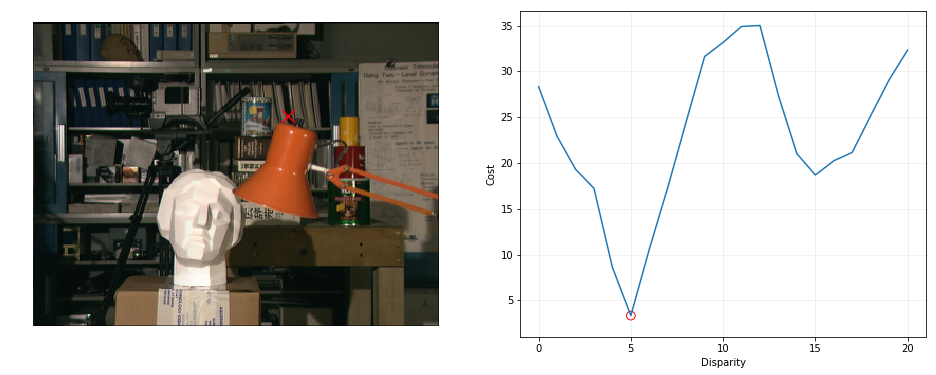

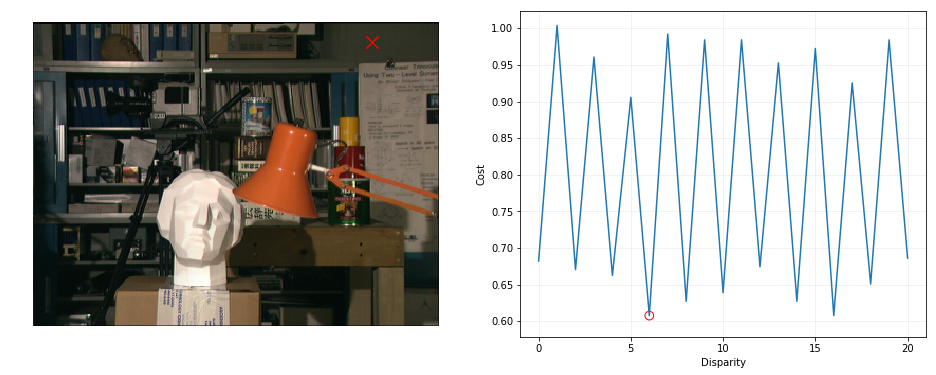

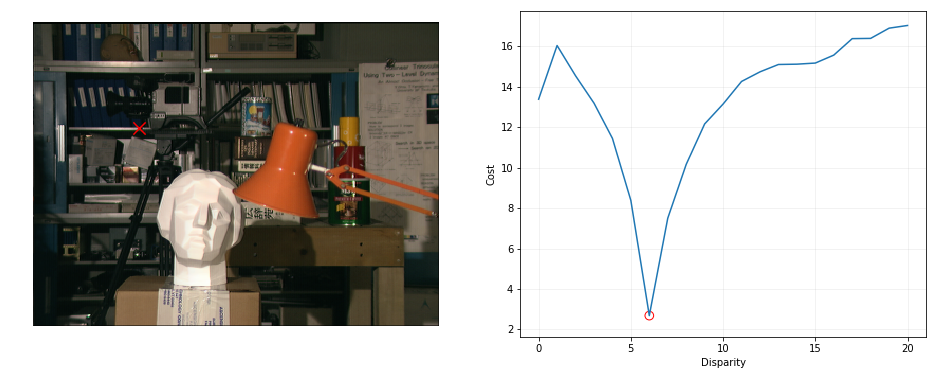

In [157]:
def plot_dsi(im, dsi, x, y):
    plt.subplot(121)
    plt.imshow(im)
    
    # draw marker at (x, y)
    plt.scatter(x, y, s=150, c="red", marker="x")
    plt.axis("off")
    
    plt.subplot(122)
    plt.plot(dsi[y,x,:])
    plt.grid(alpha=0.2)
    plt.xticks(list(range(0,dsi.shape[2] + 1, 5)))
    plt.xlabel("Disparity")
    plt.ylabel("Cost")
    #visualize minimum cost at (x, y)
    argmin = np.argmin(dsi[y,x,:])
    plt.scatter(argmin, dsi[y,x,argmin], s=75, facecolors="none", edgecolors="r", marker="o")
    
    plt.gcf().set_size_inches(16, 6)
    plt.show()
    

plot_dsi(imL, dsi_lr, 241, 89)
plot_dsi(imL, dsi_lr, 320, 19)
plot_dsi(imL, dsi_lr, 100, 100)

## Cost Aggregation

In [158]:
from scipy.ndimage.filters import convolve

#Tässä siis kerätään yhden cost-arvon sijaan yhteen monta cost-arvoa, ja haetaan
def cost_aggregation(dsi, w_size=7):
    
    result = np.zeros(dsi.shape, dtype=np.float)
    kernel = np.ones((w_size, w_size), dtype=np.float)
    for d in range(0, dsi.shape[2]):
        convolve(dsi[:,:,d], kernel, result[:,:,d], mode="constant", cval=0.0)
    
    return result

dsi_lr_ca = cost_aggregation(dsi_lr)
dsi_rl_ca = cost_aggregation(dsi_rl)

Visualization for situation where cost aggregation helps. Better comparison would be (total) error against Ground Truth.

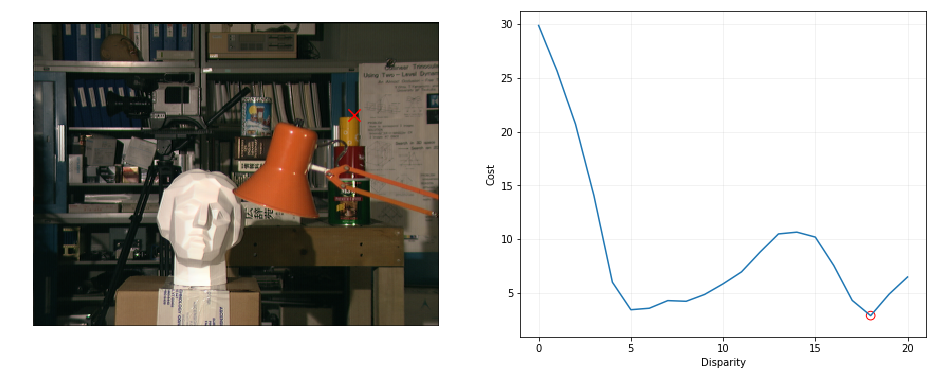

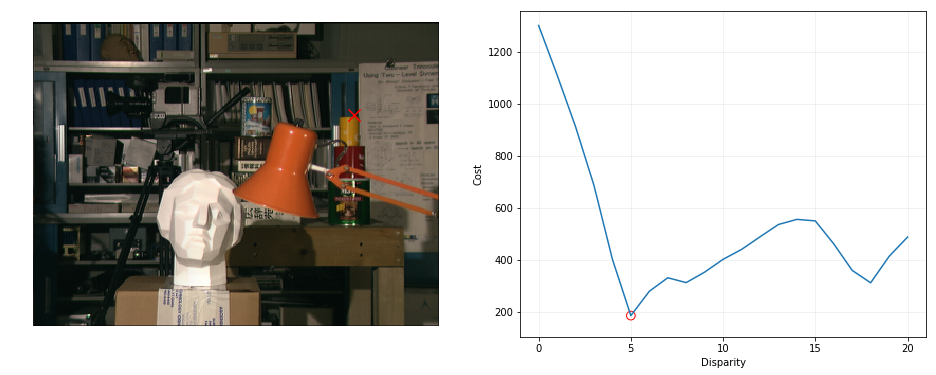

In [159]:
plot_dsi(imL, dsi_lr, 303, 88)
plot_dsi(imL, dsi_lr_ca, 303, 88)

## Sub-Pixel Estimation

Disparity can be estimated at sub-pixel accuracy by fitting a parabole on cost function points $argmin-1$, $argmin$ and $argmin+1$. Final sub-pixel disparity is at the minimum of the parabole.

In [160]:
# TODO

## Calculate Disparity Image from DSI

Simple cost aggregation can be implemented using convolution.

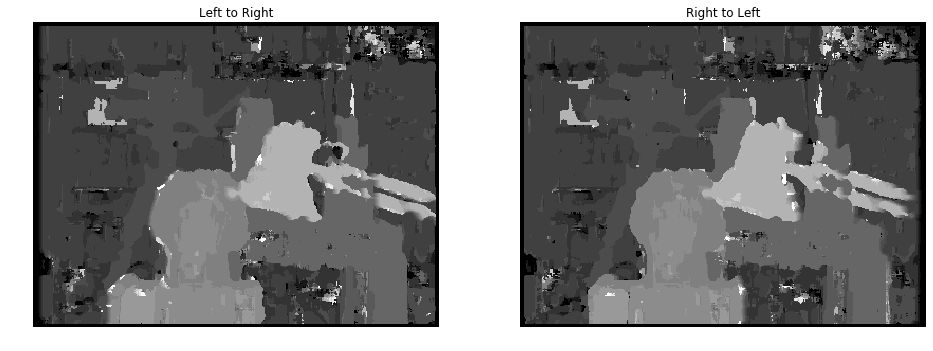

In [161]:
#Etsii dsi-matriisista disparityjen minimit
def find_disparity(dsi):
    rows = dsi.shape[0]
    cols = dsi.shape[1]
    disp = np.zeros(dsi.shape[:2], dtype=np.float)
    
    for y in range(0, rows):
        for x in range(0, cols):
            disp[y, x] = np.argmin(dsi[y,x,:])
    
    return disp
 
disp_lr = find_disparity(dsi_lr)
disp_rl = find_disparity(dsi_rl)

plt.subplot(121)
plt.imshow(disp_lr, cmap="gray")
plt.title("Left to Right")
plt.axis("off")
plt.subplot(122)
plt.imshow(disp_rl, cmap="gray")
plt.title("Right to Left")
plt.axis("off")
plt.gcf().set_size_inches(16, 8)
plt.show()

## Left to Right Consistency Check

(Could also be implemented right to left)
Compares and removes inconsistent values

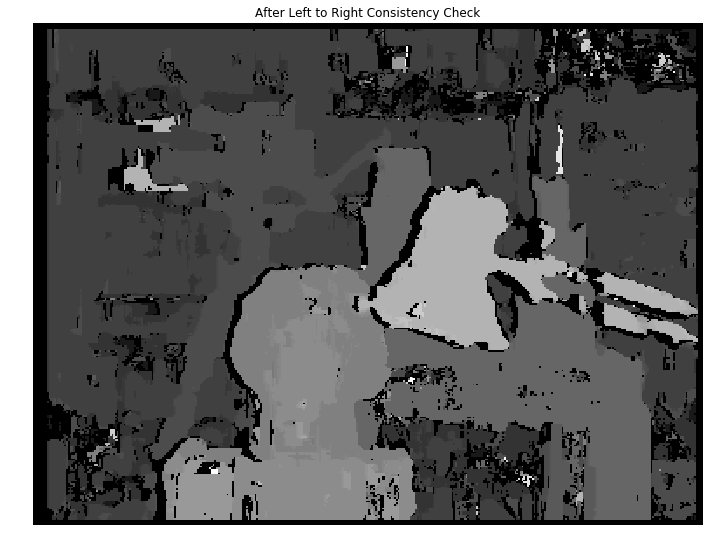

In [162]:
def lr_consistency(dispL, dispR):
    disp = np.zeros((dispL.shape), dtype=np.float)
    
    for y, x in np.ndindex(dispL.shape):
        d_l = dispL[y, x]
        x_r = x - d_l
        
        if not(0 <= x_r <= dispL.shape[1]):
            continue
        
        d_r = dispR[y, int(x_r)]
       
        if abs(d_r - d_l) <= 1.0:
            disp[y, x] = (d_l + d_r) / 2.0

    return disp

disp = lr_consistency(disp_lr, disp_rl)
plt.imshow(disp, cmap="gray")
plt.title("After Left to Right Consistency Check")
plt.axis("off")
plt.gcf().set_size_inches(12, 12)
plt.show()

## Visualization

Grayscale images are hard for humans to compare visually. Applying color map (value -> color) helps.

Window based algorithms often do not have very good edges i.e. disparity discontinuities do not match the edges in color image percisely. Good way to visualize is by using simple edge detection in original color image and overlaying it on the colored disparity image.

Colors in the colorized image depend on scaling. To compare results, scaling has to be adjusted accordingly.

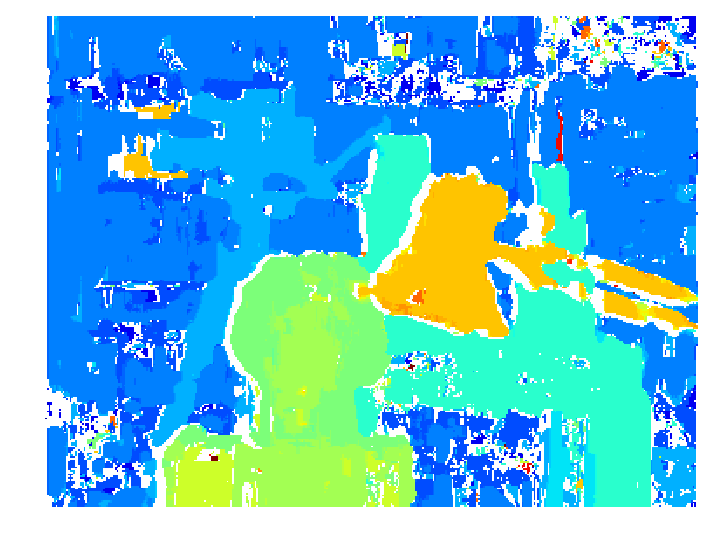

In [163]:
# plt.cm.get_cmap("jet")() returns 4 channels; 
apply_color_map = lambda img: plt.cm.get_cmap("jet")(img)[:,:,:3]
# Scale to [0, 1] range for visualization
disp_scaled = disp / disp.max()
colored = apply_color_map(disp_scaled)

# Set invalid areas to white. Invalid areas can be from original
# raw disparity image or marked as invalid after L/R consistency
# check.
colored[disp == 0.0] = (1.0, 1.0, 1.0)

plt.imshow(colored)
plt.axis("off")
plt.gcf().set_size_inches(12, 12)
plt.show()

(288, 384)
(288, 384, 3)


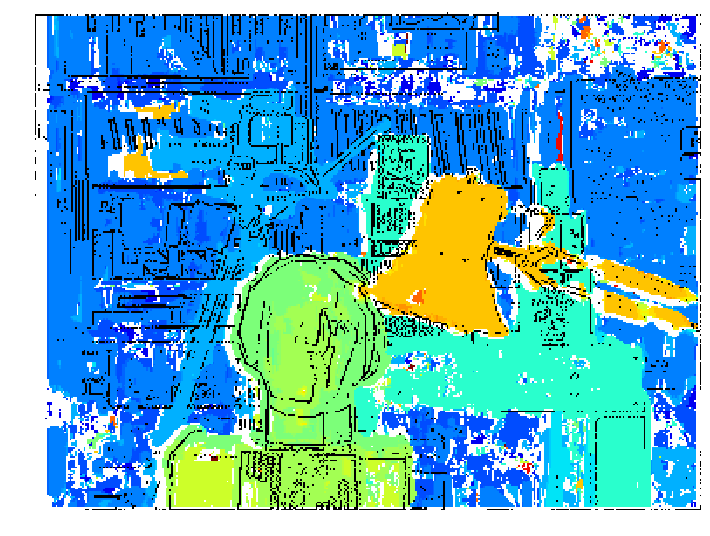

In [164]:
from skimage.filters import laplace
from skimage.color import rgb2gray

# get the edges using Laplacian filter (convolution with Laplacian kernel)
edges = laplace(rgb2gray(imL),3)
print(edges.shape)
print(colored.shape)

# draw edes to color image
colored[edges > 0.1] = (0.0, 0.0, 0.0)

plt.imshow(colored)
plt.gcf().set_size_inches(12, 12)
plt.axis("off")
plt.show()

Additional visualization against gound truth (stereo data set, usually ground truth is not known).

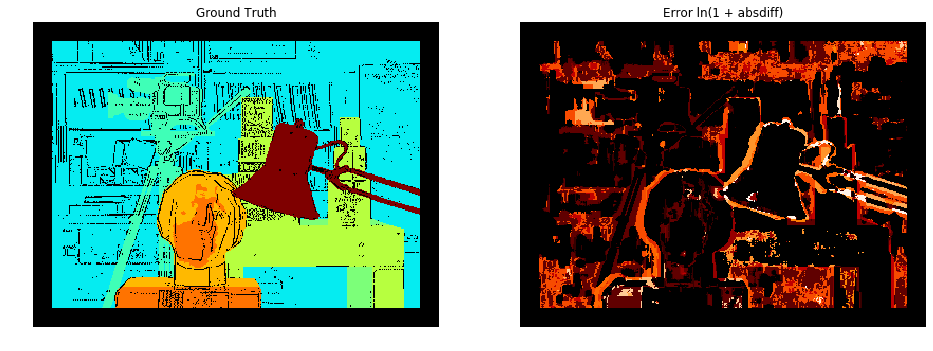

In [165]:
imGT_color = apply_color_map(imGT / imGT.max())
imGT_color[imGT == 0] = (0, 0, 0)
imGT_color[edges > 0.1] = (0, 0, 0)

# visualize difference, log(1 + absdiff) seems suitable
diff = np.log(1 + np.absolute(np.subtract(disp, imGT )))

# mask the black frame around GT image (no valid GT, error in this area is meaningless)
diff[imGT == 0.0] = 0.0

plt.subplot(121)
plt.imshow(imGT_color)
plt.title("Ground Truth")
plt.axis("off")
plt.subplot(122)
plt.imshow(diff, cmap="gist_heat")
plt.title("Error ln(1 + absdiff)")
plt.axis("off")
plt.gcf().set_size_inches(16,8)
plt.show()

## Match Confidence

Confidence map from DSI. Basically the same as `find_disparity()`, except the second best match is also considered.

def confidence_image(dsi, y_max=1.0):
    rows = dsi.shape[0]
    cols = dsi.shape[1]
    confidence = np.zeros(dsi.shape[:2], dtype=np.float)
    
    for y in range(0, rows):
        for x in range(0, cols):
            values = dsi[y,x,:].flatten()
            values.sort()
            if not (np.isfinite(values[0]) and np.isfinite(values[1])):
                continue
            
            confidence[y, x] = (values[1] - values[0]) / y_max

    return confidence

confidence = confidence_image(dsi_lr_ca)
# Scaling should be done against y_max (maximum possible matching cost), 
# for simplicity scaling to range [0, 1] without y_max. For filtering,
# using correct y_max is absolutely essential!

confidence = confidence / confidence.max()

# In left to right disparity, x values from [0, disp_max] should not be
# used (disparity search range is (partly) outside the right image).
confidence[:,0:42] = 0.0

plt.imshow(confidence, cmap="gist_heat")
plt.axis("off")
plt.gcf().set_size_inches(8,8)
plt.show()